In [2]:
import warnings
warnings.filterwarnings('ignore')
import librosa
import IPython.display as ipd
import librosa.display
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import os,sys

In [3]:
folder = 'Songs'
files_path = []
for song in os.listdir(folder):
    files_path.append(folder + '/' + song)
files_path

['Songs/Brown Munde - AP Dhillon.mp3',
 'Songs/Raataan Lambiyan - Shershaah.mp3',
 'Songs/Ranjha - Shershaah.mp3',
 'Songs/Sawan Mein Lag Gayi Aag - Badshah.mp3',
 'Songs/Tere Bin (Sonu Nigam).mp3']

In [15]:
print('Song Name : {}'.format(str(files_path[3])[str(files_path[3]).find('/')+1:str(files_path[3]).rfind('.')]))
ipd.Audio(files_path[3])

Song Name : Sawan Mein Lag Gayi Aag - Badshah


In [21]:
## Loading the files with sampling_rate = 22050 Hz
BM_data,sr = librosa.load(files_path[0],mono=True)
ranjha,_ = librosa.load(files_path[2],mono=True)
terebin,_ = librosa.load(files_path[4],mono=True)

In [33]:
## Extracting RMS from signal using librosa
FRAME_LEN = 1024
HOP_LEN = 512

rms_BM = librosa.feature.rms(BM_data,frame_length=FRAME_LEN,hop_length=HOP_LEN)[0]
rms_ranjha = librosa.feature.rms(ranjha,frame_length=FRAME_LEN,hop_length=HOP_LEN)[0]
rms_terebin = librosa.feature.rms(terebin,frame_length=FRAME_LEN,hop_length=HOP_LEN)[0]

In [34]:
rms_BM.shape

(11528,)

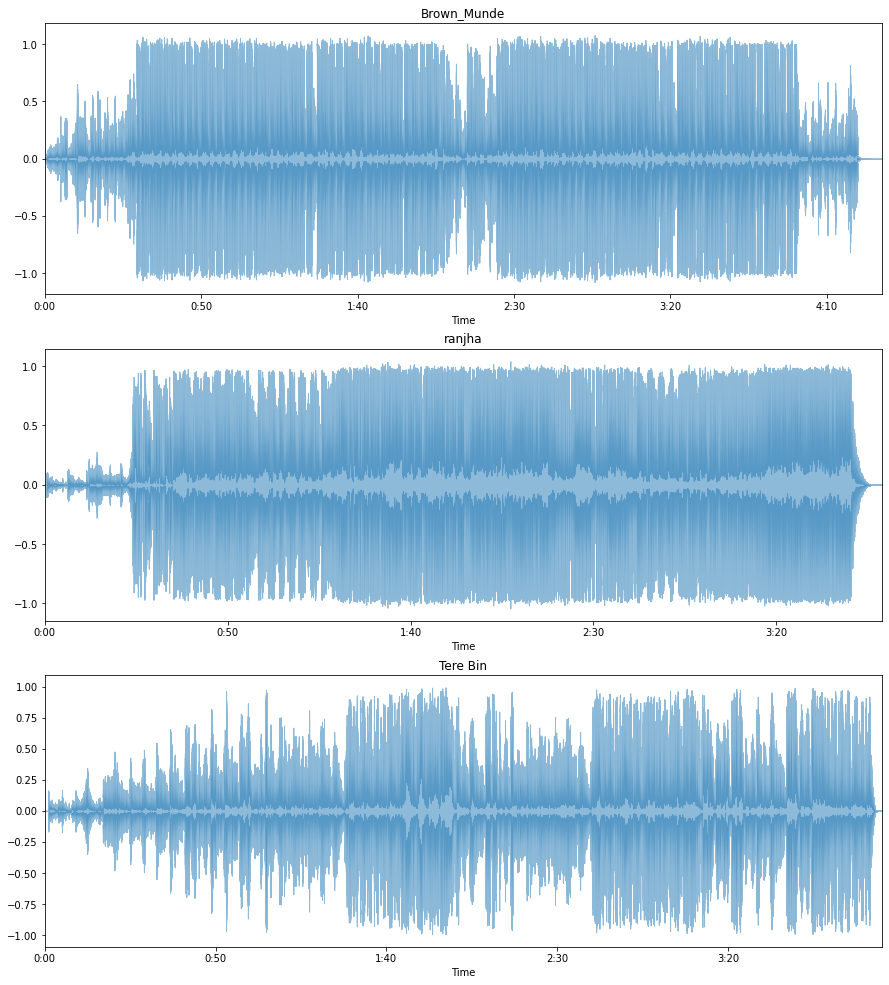

In [35]:
## Visualization of audio signal
plt.figure(figsize=(15,17))
plt.subplot(311)
librosa.display.waveplot(BM_data,sr = sr,alpha = 0.5)  ## Alpha is a parameter to make the waveplot look more intruiging
plt.title('Brown_Munde')

plt.subplot(312)
librosa.display.waveplot(ranjha,sr = sr,alpha = 0.5)
plt.title('ranjha')

plt.subplot(313)
librosa.display.waveplot(terebin,sr = sr,alpha = 0.5)
plt.title('Tere Bin')
plt.show()

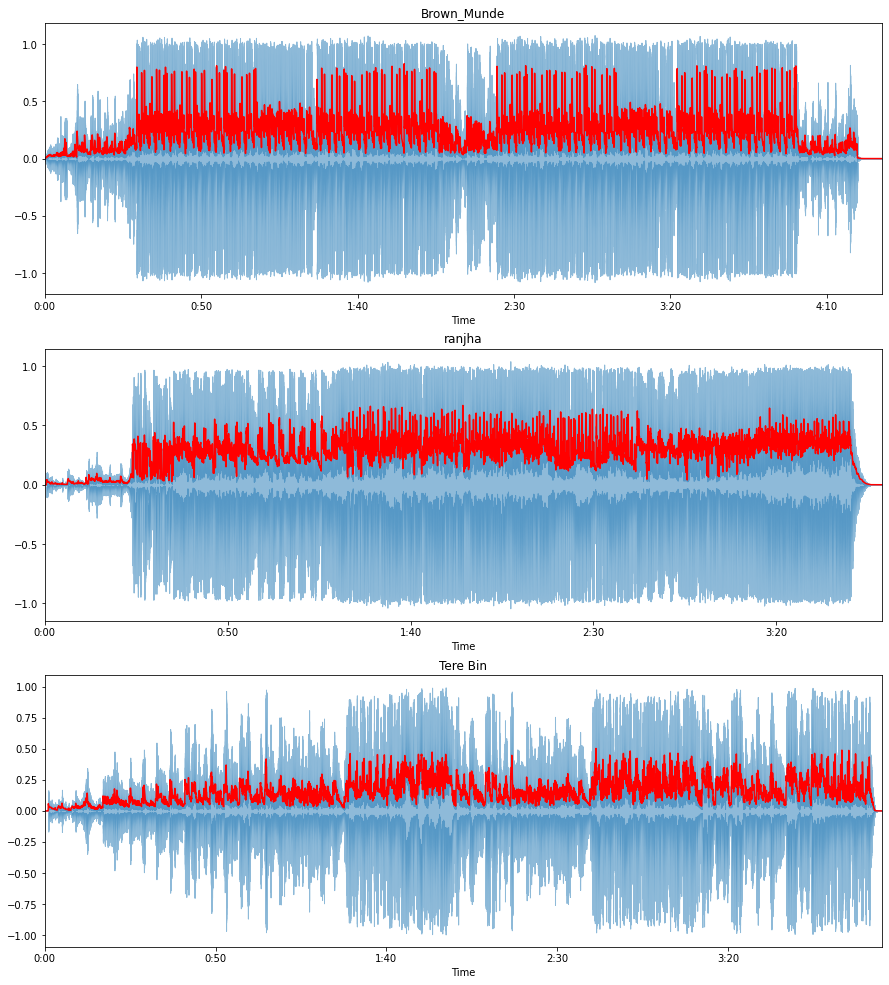

In [36]:
## Plotting the RMS Energy
## Visualize Amplitude env for all signals
## Visualization of audio signal
frames_BM = range(rms_BM.shape[0])    ## Number of frames is the size of the amplitude envelope
frames_terebin = range(rms_terebin.shape[0])
frames_ranjha = range(rms_ranjha.shape[0])

t_BM = librosa.frames_to_time(frames_BM) ## Plotting those amplitude envelope on the waveplot so we need the corresponding
t_ranjha = librosa.frames_to_time(frames_ranjha) ## time for these frames this is what librosa.frames_to_times does!!
t_terebin = librosa.frames_to_time(frames_terebin)

plt.figure(figsize=(15,17))
plt.subplot(311)
librosa.display.waveplot(BM_data,sr = sr,alpha = 0.5)
plt.plot(t_BM,rms_BM,color = 'r')
plt.title('Brown_Munde')

plt.subplot(312)
librosa.display.waveplot(ranjha,sr = sr,alpha = 0.5)
plt.plot(t_ranjha,rms_ranjha,color = 'r')
plt.title('ranjha')

plt.subplot(313)
librosa.display.waveplot(terebin,sr = sr,alpha = 0.5)
plt.plot(t_terebin,rms_terebin,color = 'r')
plt.title('Tere Bin')
plt.show()

In [37]:
## RMS from scratch
FRAME_SIZE = 1024
HOP_LENGTH = 512
def rms_overlapping(signal,frame_len = FRAME_SIZE,hop_len = HOP_LENGTH):
    rms_energy = []
    for i in range(0,len(signal),hop_len):
        energy = np.mean(signal[i:i+frame_len]**2)**0.5
        rms_energy.append(energy)
    
    return np.array(rms_energy)

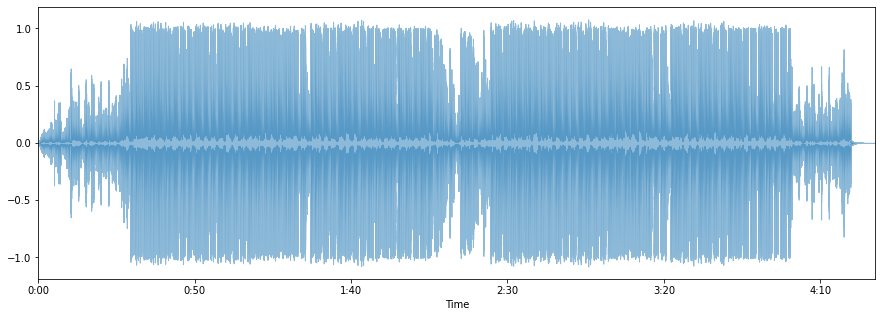

In [38]:
plt.figure(figsize=(15,5))
librosa.display.waveplot(BM_data,alpha=0.5)

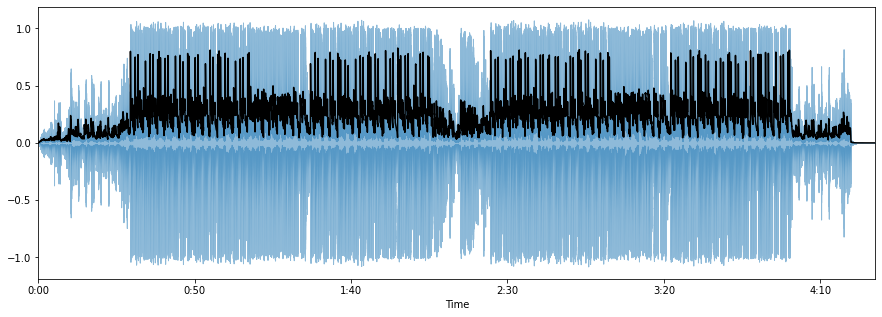

In [39]:
rms_BM = rms_overlapping(BM_data,frame_len=1024,hop_len=512)
frames = range(len(rms_BM))
t_BM = librosa.frames_to_time(frames,hop_length=512)

plt.figure(figsize=(15,5))
librosa.display.waveplot(BM_data,alpha=0.5)
plt.plot(t_BM,rms_BM,color = 'black')
plt.show()

In [40]:
# Zero-Crossing Rate using Librosa
zcr_BM = librosa.feature.zero_crossing_rate(BM_data,frame_length=1024,hop_length=512)[0]
zcr_ranjha = librosa.feature.zero_crossing_rate(ranjha,frame_length=1024,hop_length=512)[0]
zcr_terebin = librosa.feature.zero_crossing_rate(terebin,frame_length=1024,hop_length=512)[0]

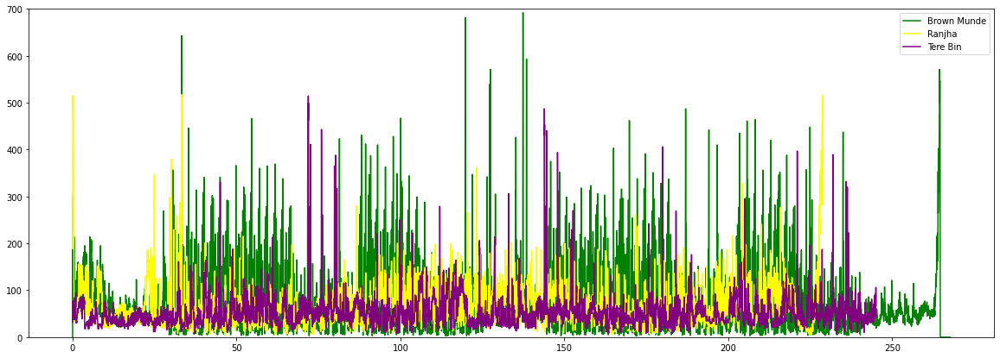

In [41]:
plt.figure(figsize = (20,7))
plt.plot(t_BM,zcr_BM*FRAME_LEN,color = 'green')
plt.plot(t_ranjha,zcr_ranjha*FRAME_LEN,color = 'yellow')
plt.plot(t_terebin,zcr_terebin*FRAME_LEN,color = 'purple')
plt.ylim((0,700))
plt.legend(['Brown Munde','Ranjha','Tere Bin'])
plt.show()

In [50]:
## Lets see the Zero Crossing Rate of a Voice and White noise and analyze it
noise_file = 'Noise/audiocheck.net_whitenoisegaussian.wav'
voice_file = 'Voice/Recording.m4a'
voice_data,_ = librosa.load(voice_file,duration=10)
noise_data,_ = librosa.load(noise_file,duration=10)

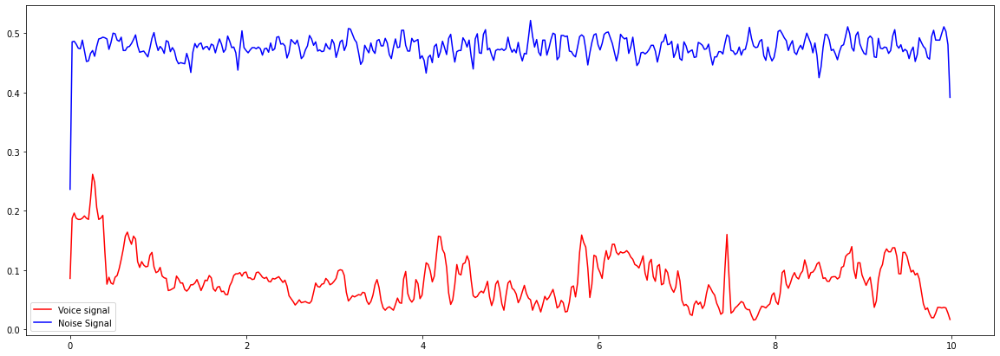

In [52]:
zcr_voice = librosa.feature.zero_crossing_rate(voice_data,frame_length=1024)[0]
zcr_noise = librosa.feature.zero_crossing_rate(noise_data,frame_length=1024)[0]
frames_voice = range(len(zcr_voice))
t_zcr = librosa.frames_to_time(frames=frames_voice)
plt.figure(figsize=(20,7))
plt.plot(t_zcr,zcr_voice,color = 'r')
plt.plot(t_zcr,zcr_noise,color = 'blue')
plt.legend(['Voice signal','Noise Signal'])
plt.show()

In [ ]:
## Noise has a ZCR > Voice